# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

> The dataset collected is related to 17 campaigns that occurred between May 2008 and November 2010, corresponding to a total of 79354 contacts. During these phone campaigns, an attractive long-term deposit application, with good interest rates, was offered. For each contact, a large number of attributes was stored (e.g. see Table 2) and if there was a success (the target variable). For the whole database considered, there were 6499 successes (8% success rate).

### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [3]:
import pandas as pd

In [4]:
df = pd.read_csv('data/bank-additional-full.csv', sep = ';')

In [5]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [7]:
# for each object col, print the unique values
for col in df.select_dtypes('object').columns:
    print(col, df[col].unique())


job ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
marital ['married' 'single' 'divorced' 'unknown']
education ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']
default ['no' 'unknown' 'yes']
housing ['no' 'yes' 'unknown']
loan ['no' 'yes' 'unknown']
contact ['telephone' 'cellular']
month ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
day_of_week ['mon' 'tue' 'wed' 'thu' 'fri']
poutcome ['nonexistent' 'failure' 'success']
y ['no' 'yes']


In [8]:
# if the col contains 'unknown', print the number of 'unknown' values
for col in df.select_dtypes('object').columns:
    if 'unknown' in df[col].unique():
        print(col, df[col].value_counts()['unknown'])
    

job 330
marital 80
education 1731
default 8597
housing 990
loan 990


In [9]:
import plotly.express as px

# for each int and float col, print a histogram
for col in df.select_dtypes(['int', 'float']).columns:
    fig = px.histogram(df, x=col, marginal="box", title=col)
    fig.show()

In [10]:
# percentage of rows where pdays is 999
df[df['pdays'] == 999].shape[0] / df.shape[0]

0.9632174419733903

In [11]:
# 96% of clients were not previously contacted
# probably we'll drop this column later

### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

The business objective of this task is to develop a predictive model based on historical data that can accurately predict whether a bank client will subscribe to a term deposit.

The bank can use this model to identify potential customers who are more likely to subscribe to a term deposit. This enables the bank to more effectively allocate their resources, such as targeting marketing campaigns towards customers who are most likely to subscribe, thereby increasing the success rate of their campaigns and potentially improving customer satisfaction.

The model's predictions will be used to make decisions about which customers to target for marketing campaigns. Ideally, the model should not only be accurate, but also interpretable, so that the reasons behind its predictions can be understood and trusted by the bank's decision-makers.

The effectiveness of the model will be evaluated based on its ability to correctly classify customers as likely or unlikely to subscribe to a term deposit, as well as its overall impact on the success rate of marketing campaigns and the bank's business objectives.

### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features (columns 1 - 7), prepare the features and target column for modeling with appropriate encoding and transformations.

In [12]:
features = pd.get_dummies(df.iloc[:, 0:7], columns=['job', 'marital', 'education', 'default', 'housing', 'loan'])

features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   age                            41188 non-null  int64
 1   job_admin.                     41188 non-null  uint8
 2   job_blue-collar                41188 non-null  uint8
 3   job_entrepreneur               41188 non-null  uint8
 4   job_housemaid                  41188 non-null  uint8
 5   job_management                 41188 non-null  uint8
 6   job_retired                    41188 non-null  uint8
 7   job_self-employed              41188 non-null  uint8
 8   job_services                   41188 non-null  uint8
 9   job_student                    41188 non-null  uint8
 10  job_technician                 41188 non-null  uint8
 11  job_unemployed                 41188 non-null  uint8
 12  job_unknown                    41188 non-null  uint8
 13  marital_divorced

In [13]:
# Prepare target column with encoding
target = df['y'].apply(lambda x: 1 if x == 'yes' else 0)

target.head()

0    0
1    0
2    0
3    0
4    0
Name: y, dtype: int64

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [14]:
# train test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=42)

### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [15]:
# establish baseline
y_train.value_counts(normalize=True)

0    0.887119
1    0.112881
Name: y, dtype: float64

In [16]:
# baseline is 88% accuracy

### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

In [17]:
# logistic regression
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)


/Users/stephenreid/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

### Problem 9: Score the Model

What is the accuracy of your model?

In [18]:
from sklearn.metrics import accuracy_score

y_pred = logreg.predict(X_test)
accuracy_score(y_test, y_pred)

0.8880256385354958

### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [19]:
# compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models. 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
import time

models = {
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'SVM': SVC()
}

# Initialize DataFrame to store results
results = pd.DataFrame(columns=['Model', 'Train Time', 'Train Accuracy', 'Test Accuracy'])

# Train and evaluate each model
for model_name, model in models.items():
    start_time = time.time()
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Compute training time
    train_time = time.time() - start_time
    
    # Compute accuracy on the training set
    train_accuracy = accuracy_score(y_train, model.predict(X_train))
    
    # Compute accuracy on the test set
    test_accuracy = accuracy_score(y_test, model.predict(X_test))
    
    # Store the results in the DataFrame
    results = results.append({
        'Model': model_name,
        'Train Time': train_time,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy
    }, ignore_index=True)

results

/Users/stephenreid/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/var/folders/94/klzqvlhs4ks9mn8r_yr8y1040000gn/T/ipykernel_66540/1222739548.py:34: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/stephenreid/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior 

,Model,Train Time,Train Accuracy,Test Accuracy
0,Logistic Regression,0.243458,0.887119,0.888026
1,KNN,0.004461,0.890971,0.877052
2,Decision Tree,0.138328,0.916966,0.864718
3,SVM,13.242617,0.887119,0.888026


### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

In [20]:
# now work with all features
all_features = df.copy()
all_features.drop(columns=['pdays'], inplace=True)
all_features.drop(columns=['duration'], inplace=True)
all_features.drop(columns=['y'], inplace=True)

all_features.info()
  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  previous        41188 non-null  int64  
 12  poutcome        41188 non-null  object 
 13  emp.var.rate    41188 non-null  float64
 14  cons.price.idx  41188 non-null  float64
 15  cons.conf.idx   41188 non-null  float64
 16  euribor3m       41188 non-null  float64
 17  nr.employed     41188 non-null 

In [21]:
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score

selector = make_column_selector(dtype_include=object)
transformer = make_column_transformer((OneHotEncoder(drop = 'first'), selector),
                                     remainder = StandardScaler())

# transform
transformed_all_features = transformer.fit_transform(all_features)

# train test split
X_train, X_test, y_train, y_test = train_test_split(transformed_all_features, target, random_state=42)

models = {
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier()
    # 'SVM': SVC()
}

# Initialize DataFrame to store results
results = []

# Train and evaluate each model
for model_name, model in models.items():
    start_time = time.time()
    
    # Train the model
    model.fit(X_train, y_train)

    # Compute training time
    train_time = time.time() - start_time

    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)
    
    # Store the results in the DataFrame
    results.append({
        'model': model_name,
        'train_time': train_time,
        'train_accuracy': accuracy_score(y_train, train_predictions),
        'test_accuracy': accuracy_score(y_test, test_predictions),
        'train_precision': precision_score(y_train, train_predictions),
        'test_precision': precision_score(y_test, test_predictions),
        'train_recall': recall_score(y_train, train_predictions),
        'test_recall': recall_score(y_test, test_predictions),
        'train_f1': f1_score(y_train, train_predictions),
        'test_f1': f1_score(y_test, test_predictions)
    })

results


/Users/stephenreid/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/stephenreid/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid t

[{'model': 'Logistic Regression',
  'train_time': 0.3222923278808594,
  'train_accuracy': 0.8997442620828073,
  'test_accuracy': 0.9001650966300865,
  'train_precision': 0.6646959459459459,
  'test_precision': 0.6631853785900783,
  'train_recall': 0.22569544020648122,
  'test_recall': 0.22029488291413704,
  'train_f1': 0.33697281096125026,
  'test_f1': 0.3307291666666667},
 {'model': 'KNN',
  'train_time': 0.003690004348754883,
  'train_accuracy': 0.9124340422776861,
  'test_accuracy': 0.8904535301544139,
  'train_precision': 0.7028008298755186,
  'test_precision': 0.520259319286872,
  'train_recall': 0.38858617722971034,
  'test_recall': 0.27840416305290544,
  'train_f1': 0.5004616805170822,
  'test_f1': 0.36271186440677966},
 {'model': 'Decision Tree',
  'train_time': 1.0359721183776855,
  'train_accuracy': 0.9954031918681817,
  'test_accuracy': 0.8414101194522676,
  'train_precision': 0.998212689901698,
  'test_precision': 0.3064516129032258,
  'train_recall': 0.9609979925437339,
  

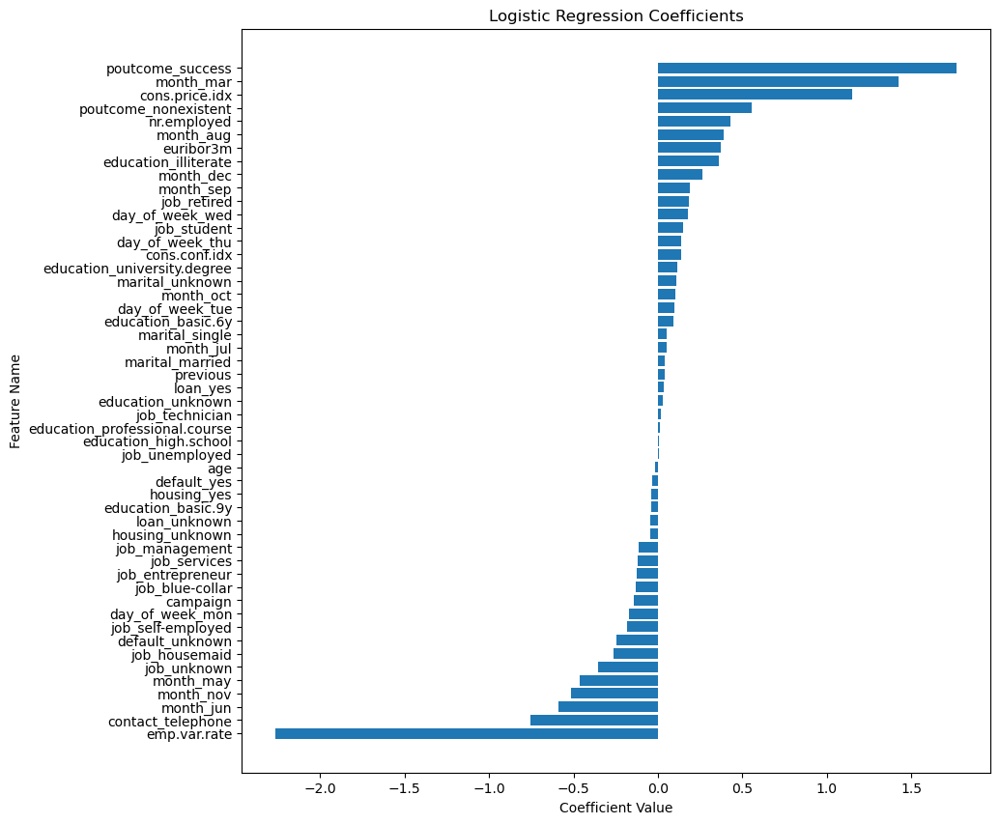

In [22]:
# do a sense check of the logistic regression coefficients

import matplotlib.pyplot as plt
import numpy as np

lgr = models['Logistic Regression']

ohe_feature_names = transformer.transformers_[0][1].get_feature_names_out()
standard_scaler_features = all_features.columns[transformer.transformers_[1][2]]

column_names = np.concatenate([ohe_feature_names, standard_scaler_features])

# plot sorted coef with feature names from all_features
plt.figure(figsize=(10, 10))
plt.barh(column_names[np.argsort(lgr.coef_[0])], np.sort(lgr.coef_[0]))
plt.title('Logistic Regression Coefficients')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature Name')
plt.show()


In [23]:
# most important features are emp.var.rate and poutcome_success
# poutcome_success is whether the previous marketing campaign was successful
# emp.var.rate is employment variation rate - quarterly indicator

# certainly, it makes sense that poutcome_success is important in determining whether a client will subscribe to a term deposit
# emp.var.rate is harder to interpret

In [35]:
# the decision tree model clearly overfit the training data
# let's see if we can improve it via a grid search

from sklearn.model_selection import GridSearchCV

# grid search for recall
grid = GridSearchCV(DecisionTreeClassifier(), {
        'max_depth': range(2, 11),
    }, cv=5, return_train_score=True)
grid.fit(X_train, y_train)

print({
    "train score": grid.cv_results_['mean_train_score'][grid.best_index_],
    "test score": grid.score(X_test, y_test),
    "average fit time": grid.cv_results_['mean_fit_time'][grid.best_index_],
    "best params": grid.best_params_,
})


{'train score': 0.9050937216349553, 'test score': 0.9009420219481402, 'average fit time': 0.11640501022338867, 'best params': {'max_depth': 6}}


In [44]:
# yes, we can!
dt = grid.best_estimator_
dt.fit(X_train, y_train)

train_predictions = dt.predict(X_train)
test_predictions = dt.predict(X_test)

print({
  'train_accuracy': accuracy_score(y_train, train_predictions),
  'test_accuracy': accuracy_score(y_test, test_predictions),
  'train_precision': precision_score(y_train, train_predictions),
  'test_precision': precision_score(y_test, test_predictions),
  'train_recall': recall_score(y_train, train_predictions),
  'test_recall': recall_score(y_test, test_predictions),
  'train_f1': f1_score(y_train, train_predictions),
  'test_f1': f1_score(y_test, test_predictions)
})

{'train_accuracy': 0.9043734421028778, 'test_accuracy': 0.9009420219481402, 'train_precision': 0.7339771729587358, 'test_precision': 0.6709511568123393, 'train_recall': 0.23974763406940064, 'test_recall': 0.2263660017346054, 'train_f1': 0.36143536532641596, 'test_f1': 0.3385214007782101}


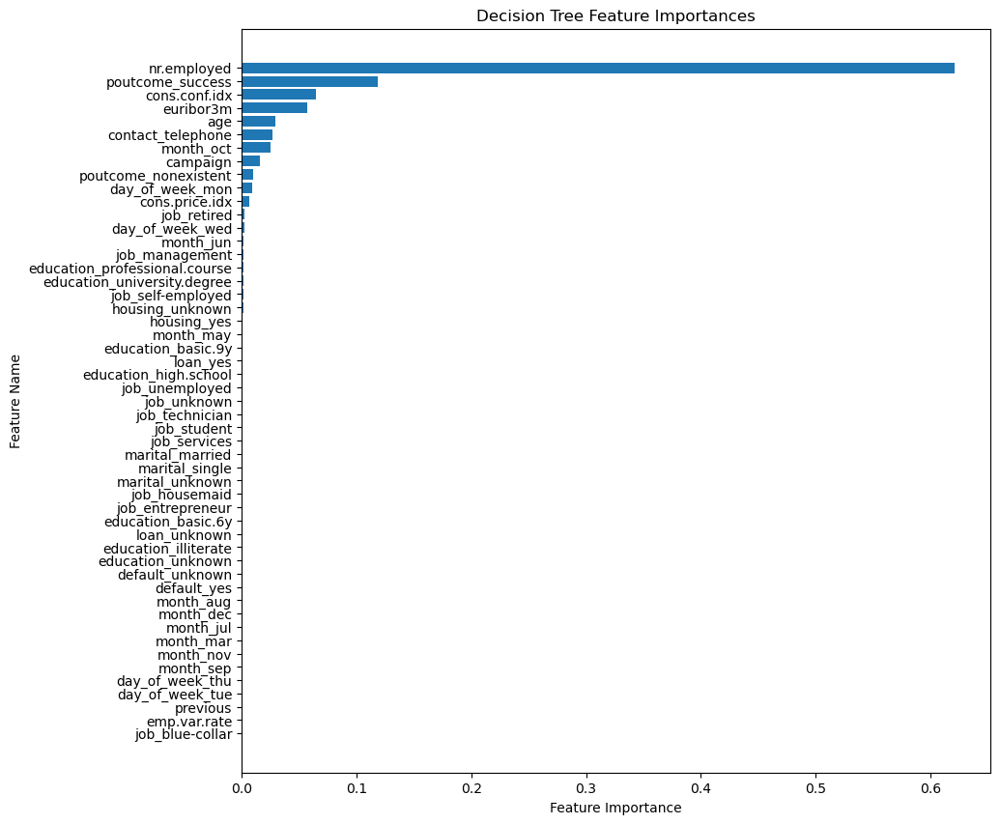

In [45]:
# print feature importances with labels
plt.figure(figsize=(10, 10))
plt.barh(column_names[np.argsort(dt.feature_importances_)], np.sort(dt.feature_importances_))
plt.title('Decision Tree Feature Importances')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.show()
